# Food Delivery Apps in Mexico: Where can it work?

## Final assigment of Applied Data Science Capstone

The project aims to answere the next questions:

1) In what neighborhoods the service can work?

2) What cities are the most profitable for the service?

In order to find the most profitable neighborhoods in Mexico this notebook is diveded in 4 parts. 

The fist, collected the data about:  

    population densities by postal code,
    
    restaurants’ concentration by postal code,

Second, build a model that determines the potential demand of the food delivery service within  the cities.

Finally, graphed the most profitable neighborhoods where the
company may enter are recommended.

## 1) Data collection

### 1.1) Population densities by postal code

Scraping Cybo.com to obtain a data frame with the city, population and area (km2 and m2) per postal code

In [105]:
#Install the lib if is necesary
#!conda install -c conda-forge BeautifulSoup4 --yes 
import sys
#!{sys.executable} -m pip install geocoder
#!conda install -c conda-forge geopy --yes
#!conda install -c conda-forge folium=0.5.0 --yes
#Import the libraries 
try:
    import requests
    from bs4 import BeautifulSoup
    import pandas as pd
    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    import geocoder
    import numpy as np
    import json
    from geopy.geocoders import Nominatim
    from pandas.io.json import json_normalize 
    import matplotlib.cm as cm
    import matplotlib.colors as colors
    from sklearn.cluster import KMeans
    import folium
    from matplotlib import pyplot as plt
    print("The libraries were succesfully imported")
except:
    print("Error")

The libraries were succesfully imported


In [106]:
# download url data from internet
url = "https://postal-codes.cybo.com/mexico/?s=-pop"
source = requests.get(url).text
cybo_data = BeautifulSoup(source, 'lxml')

In [107]:
# creat a new Dataframe
column_names = ['Postal_Code', 'City', 'Administrative_region','Population','Area','Area_km','Population_Density','Latitude', 'Longitude'] 
mexico = pd.DataFrame(columns = column_names)

# loop through to find Postal_Code, City, Administrative_region, Population and Area 
#content = cybo_data.find('div', class_='table-container p-container')
content = cybo_data.find('div', id="listcodes")
table = content.table.tbody
Postal_Code = 0
City = 0
Administrative_region = 0
Population = 0
Area = 0

for tr in table.find_all('tr'):
    i = 0
    for td in tr.find_all('td'):
        if i == 0:
            Postal_Code = td.text
            i = i + 1
        elif i == 1:
            City = td.text
            i = i + 1
        elif i == 2: 
            Administrative_region = td.text
            i = i + 1
        elif i == 3:
            Population = td.text
            i = i + 1
        elif i == 4:
            Area = td.text
    mexico = mexico.append({'Postal_Code': Postal_Code,'City': City,'Administrative_region': Administrative_region, 'Population': Population, 'Area':Area},ignore_index=True)                                

df=mexico
df.head()

,Postal_Code,City,Administrative_region,Population,Area,Area_km,Population_Density,Latitude,Longitude
0,65760,General Zuazua,Nuevo León,"318,988",10.9 km²,NaN,NaN,NaN,NaN
1,32575,—,Chihuahua,"204,154",59.2 km²,NaN,NaN,NaN,NaN
2,45653,Tlajomulco de Zúñiga,Jalisco,"193,413",44 km²,NaN,NaN,NaN,NaN
3,57000,Ciudad Nezahualcóyotl,State of Mexico,"184,992",7.9 km²,NaN,NaN,NaN,NaN
4,45650,Tlajomulco de Zúñiga,Jalisco,"149,839",48.1 km²,NaN,NaN,NaN,NaN


### Arcgis data

In [108]:
#Add latitude and longitude

def get_latlng(Postal_Code):
    # initialize your variable to None
    lat_lng_coords = None
    # loop until you get the coordinates
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, MEXICO'.format(Postal_Code))
        lat_lng_coords = g.latlng
        #print(g)
    return lat_lng_coords
    
get_latlng('06700')

Postal_Codes = df['Postal_Code']    
coords = [ get_latlng(Postal_Code) for Postal_Code in Postal_Codes.tolist() ]
df_coords = pd.DataFrame(coords, columns=['Latitude', 'Longitude'])
df['Latitude'] = df_coords['Latitude']
df['Longitude'] = df_coords['Longitude']
df[df.Postal_Code == '57000']
df.head()

,Postal_Code,City,Administrative_region,Population,Area,Area_km,Population_Density,Latitude,Longitude
0,65760,General Zuazua,Nuevo León,"318,988",10.9 km²,NaN,NaN,25.895970,-100.169747
1,32575,—,Chihuahua,"204,154",59.2 km²,NaN,NaN,31.600960,-106.368867
2,45653,Tlajomulco de Zúñiga,Jalisco,"193,413",44 km²,NaN,NaN,20.518035,-103.375178
3,57000,Ciudad Nezahualcóyotl,State of Mexico,"184,992",7.9 km²,NaN,NaN,19.407740,-99.006232
4,45650,Tlajomulco de Zúñiga,Jalisco,"149,839",48.1 km²,NaN,NaN,20.531900,-103.427440


For the density population

### Clean data (same measure)

In [109]:
#Clean data
#Identifying when area is reported as km² or m²
print(df.shape)

df['Area_km']=df['Area_km'].astype('float64')
counter = 0
for value in df['Area']:    
    if " m²" in value:
        temp = df['Area'][counter].replace(" m²","")
        temp = temp.replace(",","")
        temp = float(temp)
        temp = temp / 1000000
        df['Area_km'][counter] = temp
    elif "km²" in value:
        temp = df['Area'][counter].replace(" km²","")
        temp = temp.replace(",","")
        temp = float(temp)
        df['Area_km'][counter] = temp
    counter = counter + 1        

df['Population']=df['Population'].str.replace(",","",case = False)
df['Population']=df['Population'].astype('float64')
df.head()

(3000, 9)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


,Postal_Code,City,Administrative_region,Population,Area,Area_km,Population_Density,Latitude,Longitude
0,65760,General Zuazua,Nuevo León,318988.0,10.9 km²,10.9,NaN,25.895970,-100.169747
1,32575,—,Chihuahua,204154.0,59.2 km²,59.2,NaN,31.600960,-106.368867
2,45653,Tlajomulco de Zúñiga,Jalisco,193413.0,44 km²,44.0,NaN,20.518035,-103.375178
3,57000,Ciudad Nezahualcóyotl,State of Mexico,184992.0,7.9 km²,7.9,NaN,19.407740,-99.006232
4,45650,Tlajomulco de Zúñiga,Jalisco,149839.0,48.1 km²,48.1,NaN,20.531900,-103.427440


In [110]:
#Calculate Population_density
df['Population_Density']=df['Population_Density'].astype('float64')
df['Population_Density']=df['Population']/df['Area_km']
#Sort the data
df.sort_values(['Population_Density'], ascending=False)
df.shape

(3000, 9)

In [111]:
df.describe()


,Population,Area_km,Population_Density,Latitude,Longitude
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,20333.511667,21.720269,7747.386383,21.456726,-100.304371
std,15786.279129,91.695397,12872.839112,3.842544,5.419685
min,9554.000000,0.045987,4.778035,14.591165,-117.116230
25%,11681.500000,1.652000,2130.328510,19.283093,-102.293884
50%,15325.500000,3.333000,5478.115801,19.709358,-99.267859
75%,22695.500000,9.200000,10256.145458,23.952825,-98.462238
max,318988.000000,2072.400000,266511.165824,48.852740,2.345370


In [112]:
#Create a map to see the postal code location
address = 'MEXICO'

geolocator = Nominatim(user_agent="tn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Mexico are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Mexico are 19.4326296, -99.1331785.


In [113]:
# create map of toronto using latitude and longitude values
map_MEXICO = folium.Map(location=[latitude, longitude], zoom_start=5)

# add markers to map
for lat, lng, borough, neighborhood in zip(df['Latitude'], df['Longitude'], df['Postal_Code'], df['City']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='#01E2F6',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_MEXICO)  
    
map_MEXICO

### 1.2) Restaurants per postal code

Foursquare API


Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.

In [114]:
#Define Forsquere credentials
CLIENT_ID = '5XTHXJSH24YPE2032OILVBNNZI44J1CLQJXTRFZJUAP0CLPD' # your Foursquare ID
CLIENT_SECRET = 'KNCOCZBEVONHWYRKY0XCYYLNGMZ4TF3A1KDWFRZ4YQ0TFAQ0' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 5XTHXJSH24YPE2032OILVBNNZI44J1CLQJXTRFZJUAP0CLPD
CLIENT_SECRET:KNCOCZBEVONHWYRKY0XCYYLNGMZ4TF3A1KDWFRZ4YQ0TFAQ0


Explore the 3000 most populated Neighborhoods  with the information of Foursquere

In [119]:
LIMIT = 200 # limit of number of venues returned by Foursquare API

radius = 500 # define radius


def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
            
            # return only relevant information for each nearby venue
            venues_list.append([(
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])
            
        except:
            continue
    
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [120]:
mexico_venues = getNearbyVenues(names=df['Postal_Code'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )
#print(mexico_venues)

In [121]:
print(mexico_venues.shape)
mexico_venues.head(10)
#mexico_venues.to_csv("D:/Dropbox (Staff Causa Natura)/Trabajos preeliminares/Data Science (IBM)/Course 8/mexico_venues.csv")

(6714, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,77724,20.65439,-87.073928,Da Luigi Playa,20.655335,-87.073995,Pizza Place
1,77724,20.65439,-87.073928,Taqueria El Ñero,20.654598,-87.074524,Taco Place
2,77724,20.65439,-87.073928,Fer barber shop,20.652205,-87.075640,Health & Beauty Service
3,77724,20.65439,-87.073928,Monchis Hamburguesas & Ensaladas,20.654380,-87.074633,Burger Joint
4,77724,20.65439,-87.073928,La Piola,20.657058,-87.076266,Bistro
5,77724,20.65439,-87.073928,Xquitelicious,20.656902,-87.076316,Food Truck
6,77724,20.65439,-87.073928,"Tacos ""los Parados De Playa""",20.653596,-87.072015,Taco Place
7,77724,20.65439,-87.073928,Panadería Maná,20.657050,-87.076285,Bakery
8,77724,20.65439,-87.073928,El cafecito,20.653887,-87.078356,Coffee Shop
9,77724,20.65439,-87.073928,Las Tarascas,20.651257,-87.073449,Taco Place


In [122]:
#Let's find out how many unique categories can be curated from all the returned venues
print('There are {} uniques categories.'.format(len(mexico_venues['Venue Category'].unique())))

There are 341 uniques categories.


For this project it is necessary only the restaurants categories, so is is time to analyze the categories and keep only the food categories. 

In [123]:
print(mexico_venues['Venue Category'].unique())

['Pizza Place' 'Taco Place' 'Health & Beauty Service' 'Burger Joint'
 'Bistro' 'Food Truck' 'Bakery' 'Coffee Shop' 'Bagel Shop' 'Pharmacy'
 'Park' 'Mexican Restaurant' 'Food' 'Noodle House' 'Bar'
 'Housing Development' 'Convenience Store' 'Gym / Fitness Center' 'Market'
 'Bus Station' 'Wings Joint' 'Grocery Store' 'Dance Studio' 'Spa'
 'Movie Theater' 'Gastropub' 'Seafood Restaurant' 'Hotel' 'Museum' 'Plaza'
 'Lounge' 'Athletics & Sports' 'Ice Cream Shop' 'Beer Garden' 'Brewery'
 'Steakhouse' 'Breakfast Spot' 'Playground' 'Italian Restaurant'
 'Juice Bar' 'Food & Drink Shop' 'Snack Place' 'Shopping Mall' 'Garden'
 'Boutique' 'Clothing Store' 'Jewelry Store' 'Outlet Store' 'Outlet Mall'
 "Men's Store" 'Dessert Shop' 'Sporting Goods Shop' "Women's Store"
 'Shoe Store' 'Fast Food Restaurant' 'Warehouse Store' 'Kids Store'
 'Tailor Shop' 'Bookstore' 'Hobby Shop' 'Department Store' 'Board Shop'
 'Sandwich Place' 'History Museum' 'Accessories Store' 'Video Game Store'
 'Lingerie Store' 'Toy 

In [124]:
#Filter the veunues that are restaurants or sell food

searchfor=["Restaurant",
    "Bakery",
    "Brazilian Restaurant",
    "Brewery",
    "Ice Cream Shop",
    "Fish & Chips Shop",
    "Breakfast Spot",
    "Restaurant",
    "Wings Joint",
    "Food Stand",
    "Spanish Restaurant",
    "Burger Joint",
    "BBQ Joint",
    "Coffee Shop",
    "Seafood Restaurant",
    "Southern / Soul Food Restaurant",
    "Sports Club",
    "Food",
    "Beer Garden",
    "Sandwich Place",
    "Soup Place",
    "Asian Restaurant",
    "Fast Food Restaurant",
    "French Restaurant",
    "Fried Chicken Joint",
    "Food Court",
    "Empanada Restaurant",
    "Snack Place",
    "Wine Bar",
    "Dessert Shop",
    "Pastry Shop",
    "Pie Shop",
    "Bar",
    "Juice Bar",
    "Diner",
    "CafÃ©",
    "Tea Room",
    "Italian Restaurant",
    "Food Truck",
    "Cheese Shop",
    "Creperie",
    "Sushi Restaurant",
    "Wine Shop",
    "Steakhouse",
    "American Restaurant",
    "Comfort Food Restaurant",
    "Skating Rink",
    "Chinese Restaurant",
    "Frozen Yogurt Shop",
    "Donut Shop",
    "Gluten-free Restaurant",
    "Japanese Restaurant",
    "Buffet",
    "Bistro",
    "Falafel Restaurant",
    "Rock Club",
    "Vegetarian / Vegan Restaurant",
    "Sports Bar",
    "Latin American Restaurant",
    "Tapas Restaurant",
    "Caribbean Restaurant",
    "Middle Eastern Restaurant",
    "Food & Drink Shop",
    "Cupcake Shop",
    "Fondue Restaurant",
    "New American Restaurant",
    "Hot Dog Joint",
    "Argentinian Restaurant",
    "Cajun / Creole Restaurant",
    "Russian Restaurant",
    "Salad Place",
    "Bed & Breakfast",
    "Korean Restaurant",
    "Peruvian Restaurant",
    "Ukrainian Restaurant",
    "Cantonese Restaurant",
    "Cafeteria",
    "Fruit & Vegetable Store",
    "Molecular Gastronomy Restaurant",
    "Yucatecan Restaurant",
    "Cocktail Bar",
    "Beer Bar",
    "Tex-Mex Restaurant",
    "Health Food Store",
    "Bagel Shop",
    "Chocolate Shop",
    "Thai Restaurant",
    "Greek Restaurant",
    "Paella Restaurant",
    "Lebanese Restaurant",
    "Cuban Restaurant",
    "Food Service",
    "Kebab Restaurant",
    "Vietnamese Restaurant",
    "Pet CafÃ©",
    "Modern European Restaurant",
    "Noodle House",
    "South American Restaurant",
    "Eastern European Restaurant",
    "Venezuelan Restaurant",
    "Theme Restaurant",
    "Mediterranean Restaurant"]
mexico_venues["TrueFalse_food"] = mexico_venues['Venue Category'].apply(lambda x: 1 if any(i in x for i in searchfor) else 0)

filter = mexico_venues['TrueFalse_food']==1


# printing only filtered columns  
mexico_venues_food=mexico_venues.where(filter).dropna() 
#reindex
mexico_venues_food.reset_index(drop=True, inplace=True)
#drop the variable 'TrueFalse_food'
mexico_venues_food=mexico_venues_food.drop(['TrueFalse_food'], axis=1)
mexico_venues_food.shape

(3222, 7)

In [125]:
mexico_venues_food.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,77724,20.65439,-87.073928,Monchis Hamburguesas & Ensaladas,20.654380,-87.074633,Burger Joint
1,77724,20.65439,-87.073928,La Piola,20.657058,-87.076266,Bistro
2,77724,20.65439,-87.073928,Xquitelicious,20.656902,-87.076316,Food Truck
3,77724,20.65439,-87.073928,Panadería Maná,20.657050,-87.076285,Bakery
4,77724,20.65439,-87.073928,El cafecito,20.653887,-87.078356,Coffee Shop
5,77724,20.65439,-87.073928,Ty-coz Express,20.657087,-87.076293,Bagel Shop
6,77724,20.65439,-87.073928,Tere Cazola,20.650835,-87.072564,Bakery
7,77724,20.65439,-87.073928,Brontos,20.657062,-87.076290,Burger Joint
8,77724,20.65439,-87.073928,Safari,20.653523,-87.077722,Burger Joint
9,77724,20.65439,-87.073928,Restaurante Xnipek - Tradición Yucateca,20.650743,-87.071701,Mexican Restaurant


In [126]:
# create map of mexico using latitude and longitude values
map_MEXICO_venues = folium.Map(location=[latitude, longitude], zoom_start=5)

# set color scheme for the clusters
cat_venues=2
x = np.arange(cat_venues)
ys = [i + x + (i*x)**2 for i in range(cat_venues)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


# add markers to map
for lat, lng, venue, venue_category, cat_venues in zip(mexico_venues['Venue Latitude'], mexico_venues['Venue Longitude'], mexico_venues['Venue'], mexico_venues['Venue Category'], mexico_venues['TrueFalse_food']):
    label = '{}, {}'.format( venue, venue_category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color=rainbow[int(cat_venues)-1],
        fill=True,
        fill_color=rainbow[int(cat_venues)-1],
        fill_opacity=0.7,
        parse_html=False).add_to(map_MEXICO_venues)  
    
map_MEXICO_venues

In [127]:
#Food venues per postal code

# one hot encoding
mexico_onehot = pd.get_dummies(mexico_venues_food[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
mexico_onehot['Neighborhood'] = mexico_venues_food['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [mexico_onehot.columns[-1]] + list(mexico_onehot.columns[:-1])
mexico_onehot = mexico_onehot[fixed_columns]

mexico_onehot.head(10)


,Neighborhood,American Restaurant,Argentinian Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Belgian Restaurant,Bistro,Brazilian Restaurant,Breakfast Spot,Brewery,Buffet,Burger Joint,Cafeteria,Cantonese Restaurant,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Creperie,Cuban Restaurant,Cupcake Shop,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Donut Shop,Fast Food Restaurant,Fish & Chips Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Gay Bar,German Restaurant,Greek Restaurant,Health Food Store,Hot Dog Joint,Hungarian Restaurant,Ice Cream Shop,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Juice Bar,Karaoke Bar,Korean Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,New American Restaurant,Noodle House,Pastry Shop,Piano Bar,Pie Shop,Ramen Restaurant,Restaurant,Rock Club,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Skating Rink,Snack Place,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sports Bar,Sports Club,Steakhouse,Sushi Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tea Room,Theme Restaurant,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Wings Joint
0,77724,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,77724,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,77724,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,77724,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,77724,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,77724,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,77724,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,77724,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,77724,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,77724,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [128]:
mexico_onehot.shape

(3222, 98)

In [129]:
#Next, let's group rows by neighborhood and by taking the sum of each category

mexico_grouped = mexico_onehot.groupby('Neighborhood').sum().reset_index()
#mexico_grouped

In [130]:
mexico_grouped.shape

(615, 98)

In [131]:
#Sum the number of food venues and the number of categories per postal code
mexico_resume_all=mexico_grouped.melt(id_vars=['Neighborhood'])
mexico_resume_all.shape
#mexico_resume_all

(59655, 3)

In [132]:
filter = mexico_resume_all['value']!=0


# printing only filtered columns  
mexico_resume=mexico_resume_all.where(filter).dropna() 
#reindex
mexico_resume.reset_index(drop=True, inplace=True)
#drop the variable 'TrueFalse_food'
mexico_resume.shape

(2325, 3)

In [133]:
mexico_resume['no_categories']=1
mexico_resume.sort_values(['Neighborhood'], ascending=False)
mexico_resume.shape

(2325, 4)

In [134]:
#Next, let's group rows by neighborhood and by taking the sum of each category

mexico_resume_pc = mexico_resume.groupby('Neighborhood').sum().reset_index()
mexico_resume_pc=mexico_resume_pc.rename(columns={"value": "no_restaurant", "Neighborhood": "postal_code"})
mexico_resume_pc.sort_values(['no_restaurant'], ascending=False)
mexico_resume_pc.shape

(615, 3)

In [135]:
mexico_resume_pc.shape

(615, 3)

In [136]:
mexico_resume_pc.describe()

,no_restaurant,no_categories
count,615.000000,615.000000
mean,5.239024,3.780488
std,7.307783,4.107149
min,1.000000,1.000000
25%,1.000000,1.000000
50%,2.000000,2.000000
75%,6.000000,5.000000
max,65.000000,31.000000


In [137]:
#Merge the two dataframes (one with the population information and the other with the restaurants information)
information=mexico_resume_pc.merge(df, left_on='postal_code', right_on='Postal_Code')
information.sort_values(['City'], ascending=False)
information.shape

(615, 12)

In [138]:
postalcode_df=information
postalcode_df['City']=np.where((information.City=='—'),information['Administrative_region'],information.City)
postalcode_df.sort_values(['City'], ascending=False)
postalcode_df.shape

(615, 12)

## 2) Potential demand of the service

Group data in cities

In [139]:
city_df=postalcode_df.groupby('City').sum().reset_index()

#Re-estimate the population density
city_df['Population_Density']=city_df['Population']/city_df['Area_km']
#Here is not necesary the lat and lon
city_df=city_df.drop(['Latitude', 'Longitude'], axis=1)

city_df.sort_values(['no_restaurant'], ascending=False)
city_df.shape

(262, 6)

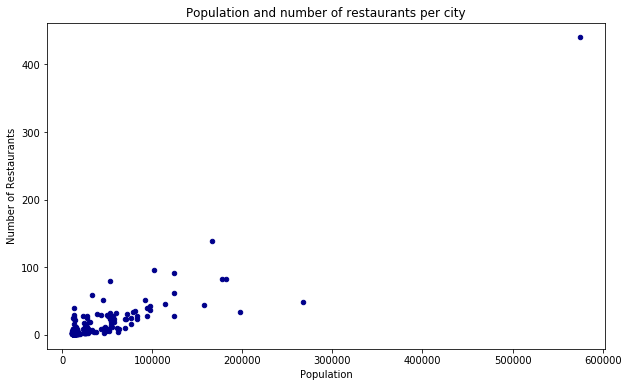

In [140]:
from matplotlib import pyplot as plt
#Plot the density population and no_restaurants
city_df.plot(kind='scatter', x='Population', y='no_restaurant', figsize=(10, 6), color='darkblue')

plt.title('Population and number of restaurants per city')
plt.xlabel('Population')
plt.ylabel('Number of Restaurants')

plt.show()


### 2.1) Clusters of cities

In [141]:
# set number of clusters
kclusters = 4

city_information_clustering = city_df.drop('City', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(city_information_clustering)
#city_df=city_df.drop(['Cluster Labels'], axis=1)
city_df.insert(0, 'Cluster Labels', kmeans.labels_)
# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:100] 

array([0, 3, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 3, 3, 0, 0, 0, 3, 0,
       0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 0,
       3, 3, 0, 0, 0, 0, 3, 1, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 1, 3, 0, 3,
       3, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0])

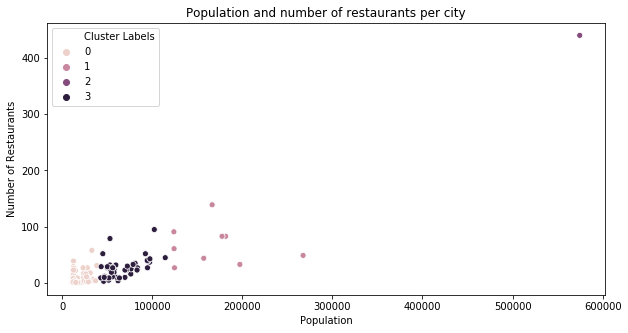

In [142]:
import seaborn as sns

scatter_x=city_df['Population']
scatter_y=city_df['no_restaurant']
group=city_df['Cluster Labels']

plt.figure(figsize=(10,5))
sns.scatterplot(x=scatter_x, y=scatter_y, hue=group)
plt.title('Population and number of restaurants per city')
plt.xlabel('Population')
plt.ylabel('Number of Restaurants')
plt.show()

In [143]:
city_df.loc[city_df['Cluster Labels'] == 0, city_df.columns[[1] + list(range(5, city_df.shape[1]))]]

,City,Area_km,Population_Density
0,Acanceh,5.200,2255.576923
2,Acatic,29.400,514.965986
3,Acaxochitlán,64.700,197.047913
4,Acolman de Netzahualcóyotl,1.584,9508.207071
5,Acuaco,2.943,4137.614679
6,Agua Dulce,90.000,148.366667
8,Alborada Jaltenco,0.765,20023.529412
9,"Allende, Coahuila",4.973,2454.051880
10,"Animas Trujano, Oaxaca",1.436,9797.353760
11,Apatzingán,2.365,6503.171247


In [144]:
city_df.loc[city_df['Cluster Labels'] == 1, city_df.columns[[1] + list(range(5, city_df.shape[1]))]]

,City,Area_km,Population_Density
7,Aguascalientes City,12.520,9926.118211
73,Ecatepec de Morelos,15.014,10470.494205
84,Guadalajara,15.101,8216.674392
124,Monterrey,22.369,8114.980553
176,San Luis Potosí City,34.679,4802.445284
201,State of Mexico,132.115,1493.486735
241,Veracruz,166.706,748.311399
259,"Álvaro Obregón, Mexico City",10.689,16606.324259
261,—,45.267,5909.139108


In [145]:
city_df.loc[city_df['Cluster Labels'] == 2, city_df.columns[[1] + list(range(5, city_df.shape[1]))]]

,City,Area_km,Population_Density
118,Mexico City,43.56,13189.348026


In [146]:
city_df.loc[city_df['Cluster Labels'] == 3, city_df.columns[[1] + list(range(5, city_df.shape[1]))]]

,City,Area_km,Population_Density
1,Acapulco,4.802000,10223.865056
18,Azcapotzalco,2.941000,18071.404284
28,Campeche City,7.442000,7129.266326
33,Celaya,9.799000,6088.172262
37,Chihuahua,6.278000,7342.306467
38,Chihuahua City,13.554000,5979.710786
42,Ciudad López Mateos,7.511000,11139.661829
45,Ciudad Nezahualcóyotl,5.888000,19442.934783
46,Ciudad Nicolás Romero,6.929000,8966.084572
47,Ciudad Obregón,294.189000,330.107516


In [147]:
#Create a map with the cluster information

#Merge the detabes
city_clusters=df.merge(city_df, left_on='City', right_on='City')
city_clusters.head()

,Postal_Code,City,Administrative_region,Population_x,Area,Area_km_x,Population_Density_x,Latitude,Longitude,Cluster Labels,no_restaurant,no_categories,Population_y,Area_km_y,Population_Density_y
0,32575,—,Chihuahua,204154.0,59.2 km²,59.200,3448.547297,31.600960,-106.368867,1,49.0,41,267489.0,45.267,5909.139108
1,56334,—,State of Mexico,136805.0,9.2 km²,9.200,14870.108696,19.434929,-98.948215,1,49.0,41,267489.0,45.267,5909.139108
2,56335,—,State of Mexico,107102.0,7.7 km²,7.700,13909.350649,19.427569,-98.930545,1,49.0,41,267489.0,45.267,5909.139108
3,04369,—,Mexico City,94786.0,2.701 km²,2.701,35092.928545,19.328271,-99.164610,1,49.0,41,267489.0,45.267,5909.139108
4,55883,—,State of Mexico,92326.0,4.417 km²,4.417,20902.422459,19.602826,-98.979480,1,49.0,41,267489.0,45.267,5909.139108


In [148]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], tiles='OpenStreetMap', zoom_start=5)

# set color scheme for the clusters
#rainbow=["#2C1C3D","#834C7D","#C7869D","#ECCFC9"]
rainbow=["#C7869D","#834C7D","#2C1C3D","#ECCFC9"]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(city_clusters['Latitude'], city_clusters['Longitude'], city_clusters['Postal_Code'], city_clusters['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2.5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters


## 2.2) Profit prediction

In [149]:
#Normalization of the variables (beta and gama)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

city_norm=city_df
city_norm=city_norm.drop(['Cluster Labels','Area_km','Population_Density'], axis=1)

city_norm_df = scaler.fit_transform(city_norm.iloc[:,1:3])
city_norm_df = pd.DataFrame(city_norm_df)
city_norm_df["City"] = city_norm["City"]
city_norm_df['Population']=city_norm['Population']
city_norm_df.columns = ['beta','gama','City','Population']
city_norm_df.head()

,beta,gama,City,Population
0,0.002278,0.003460,Acanceh,11729.0
1,0.011390,0.013841,Acapulco,49095.0
2,0.002278,0.003460,Acatic,15140.0
3,0.000000,0.000000,Acaxochitlán,12749.0
4,0.000000,0.000000,Acolman de Netzahualcóyotl,15061.0


In [150]:
#The probability of buying per scenario
finantial_df=city_norm_df
p_best=0.8*0.18+0.15*city_norm_df['beta']+0.05*city_norm_df['gama']
p_base=0.8*0.10+0.15*city_norm_df['beta']+0.05*city_norm_df['gama']
p_worst=0.8*0.03+0.15*city_norm_df['beta']+0.05*city_norm_df['gama']
finantial_df.insert(4,"p_best",p_best)
finantial_df.insert(5,"p_base",p_base)
finantial_df.insert(6,"p_worst",p_worst)

#the demand value per scenario
q_best=finantial_df['Population']*finantial_df['p_best']
q_base=finantial_df['Population']*finantial_df['p_base']
q_worst=finantial_df['Population']*finantial_df['p_worst']
finantial_df.insert(7,"q_best",q_best)
finantial_df.insert(8,"q_base",q_base)
finantial_df.insert(9,"q_worst",q_worst)

#The cost value per scenario
c_best=finantial_df['q_best']*0.1+20000
c_base=finantial_df['q_base']*0.1+20000
c_worst=finantial_df['q_worst']*0.1+20000
finantial_df.insert(10,"c_best",c_best)
finantial_df.insert(11,"c_base",c_base)
finantial_df.insert(12,"c_worst",c_worst)
#The revenue per scenario
r_best=q_best-c_best
r_base=q_base-c_base
r_worst=q_worst-c_worst
finantial_df.insert(13,"r_best",r_best)
finantial_df.insert(14,"r_base",r_base)
finantial_df.insert(15,"r_worst",r_worst)

#finantial_df.sort_values(['r_best'], ascending=False)



In [151]:
city_analysis=finantial_df.merge(city_df,left_on='City', right_on='City')
city_analysis=city_analysis.drop('Population_x', axis=1)
city_analysis.head()


,beta,gama,City,p_best,p_base,p_worst,q_best,q_base,q_worst,c_best,c_base,c_worst,r_best,r_base,r_worst,Cluster Labels,no_restaurant,no_categories,Population_y,Area_km,Population_Density
0,0.002278,0.003460,Acanceh,0.144515,0.080515,0.024515,1695.012870,944.356870,287.532870,20169.501287,20094.435687,20028.753287,-18474.488417,-19150.078817,-19741.220417,0,2.0,2,11729.0,5.200,2255.576923
1,0.011390,0.013841,Acapulco,0.146400,0.082400,0.026400,7187.531063,4045.451063,1296.131063,20718.753106,20404.545106,20129.613106,-13531.222043,-16359.094043,-18833.482043,3,6.0,5,49095.0,4.802,10223.865056
2,0.002278,0.003460,Acatic,0.144515,0.080515,0.024515,2187.952498,1218.992498,371.152498,20218.795250,20121.899250,20037.115250,-18030.842752,-18902.906752,-19665.962752,0,2.0,2,15140.0,29.400,514.965986
3,0.000000,0.000000,Acaxochitlán,0.144000,0.080000,0.024000,1835.856000,1019.920000,305.976000,20183.585600,20101.992000,20030.597600,-18347.729600,-19082.072000,-19724.621600,0,1.0,1,12749.0,64.700,197.047913
4,0.000000,0.000000,Acolman de Netzahualcóyotl,0.144000,0.080000,0.024000,2168.784000,1204.880000,361.464000,20216.878400,20120.488000,20036.146400,-18048.094400,-18915.608000,-19674.682400,0,1.0,1,15061.0,1.584,9508.207071


In [152]:
#city_analysis.to_csv("D:/Dropbox (Staff Causa Natura)/Trabajos preeliminares/Data Science (IBM)/Course 8/finantial_analysis.csv")

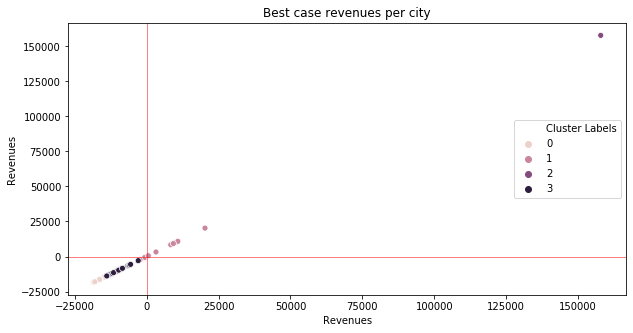

In [153]:
scatter_x=city_analysis['r_best']
scatter_y=city_analysis['r_best']
group=city_analysis['Cluster Labels']

plt.figure(figsize=(10,5))
sns.scatterplot(x=scatter_x, y=scatter_y, hue=group)
plt.title('Best case revenues per city')
plt.xlabel('Revenues')
plt.ylabel('Revenues')
plt.axhline(y=0, color='red',linewidth=.5, linestyle='-')
plt.axvline(x=0, color='red',linewidth=.5, linestyle='-')
plt.show()

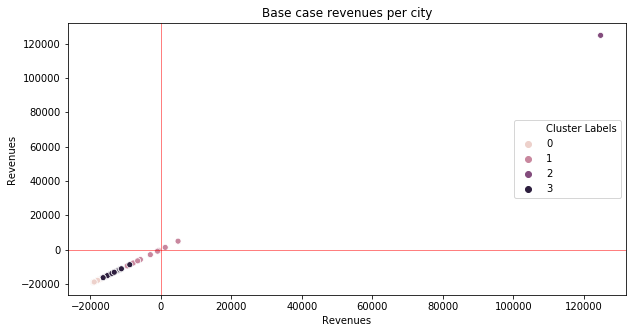

In [154]:
scatter_x=city_analysis['r_base']
scatter_y=city_analysis['r_base']
group=city_analysis['Cluster Labels']

plt.figure(figsize=(10,5))
sns.scatterplot(x=scatter_x, y=scatter_y, hue=group)
plt.title('Base case revenues per city')
plt.xlabel('Revenues')
plt.ylabel('Revenues')
plt.axhline(y=0, color='red',linewidth=.5, linestyle='-')
plt.axvline(x=0, color='red',linewidth=.5, linestyle='-')
plt.show()

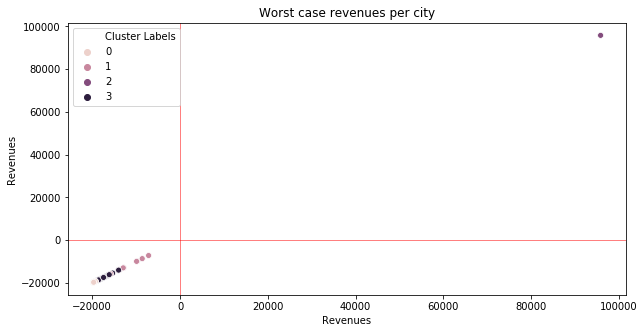

In [155]:
scatter_x=city_analysis['r_worst']
scatter_y=city_analysis['r_worst']
group=city_analysis['Cluster Labels']

plt.figure(figsize=(10,5))
sns.scatterplot(x=scatter_x, y=scatter_y, hue=group)
plt.title('Worst case revenues per city')
plt.xlabel('Revenues')
plt.ylabel('Revenues')
plt.axhline(y=0, color='red',linewidth=.5, linestyle='-')
plt.axvline(x=0, color='red',linewidth=.5, linestyle='-')
plt.show()

In [156]:
city_df.head()

,Cluster Labels,City,no_restaurant,no_categories,Population,Area_km,Population_Density
0,0,Acanceh,2.0,2,11729.0,5.200,2255.576923
1,3,Acapulco,6.0,5,49095.0,4.802,10223.865056
2,0,Acatic,2.0,2,15140.0,29.400,514.965986
3,0,Acaxochitlán,1.0,1,12749.0,64.700,197.047913
4,0,Acolman de Netzahualcóyotl,1.0,1,15061.0,1.584,9508.207071


In [157]:
city_df.loc[city_df['Cluster Labels'] == 3, city_df.columns[[1] + list(range(1, city_df.shape[1]))]]

,City,City,no_restaurant,no_categories,Population,Area_km,Population_Density
1,Acapulco,Acapulco,6.0,5,49095.0,4.802000,10223.865056
18,Azcapotzalco,Azcapotzalco,79.0,37,53148.0,2.941000,18071.404284
28,Campeche City,Campeche City,32.0,21,53056.0,7.442000,7129.266326
33,Celaya,Celaya,32.0,24,59658.0,9.799000,6088.172262
37,Chihuahua,Chihuahua,3.0,3,46095.0,6.278000,7342.306467
38,Chihuahua City,Chihuahua City,35.0,25,81049.0,13.554000,5979.710786
42,Ciudad López Mateos,Ciudad López Mateos,27.0,21,83670.0,7.511000,11139.661829
45,Ciudad Nezahualcóyotl,Ciudad Nezahualcóyotl,45.0,36,114480.0,5.888000,19442.934783
46,Ciudad Nicolás Romero,Ciudad Nicolás Romero,4.0,4,62126.0,6.929000,8966.084572
47,Ciudad Obregón,Ciudad Obregón,37.0,25,97114.0,294.189000,330.107516


In [158]:
city_df.groupby('Cluster Labels').describe()


no_restaurant                                               \
                       count        mean        std    min     25%    50%   
Cluster Labels                                                              
0                      206.0    4.742718   7.252036    1.0    1.00    2.0   
1                        9.0   67.777778  35.198643   27.0   44.00   61.0   
2                        1.0  440.000000        NaN  440.0  440.00  440.0   
3                       46.0   25.978261  18.231218    3.0   11.25   23.5   

                             no_categories                                \
                  75%    max         count        mean        std    min   
Cluster Labels                                                             
0                 5.0   58.0         206.0    3.563107   4.372129    1.0   
1                83.0  139.0           9.0   49.666667  19.422925   27.0   
2               440.0  440.0           1.0  290.000000        NaN  290.0   
3                32.0   95.0          46.0   18.565217  10.719975    3.0   

                                            Population                 \
                  25%    50%     75%    max      count           mean   
Cluster Labels                                                          
0                 1.0    2.0    4.00   31.0      206.0   16392.631068   
1                33.0   48.0   63.00   85.0        9.0  168964.555556   
2               290.0  290.0  290.00  290.0        1.0  574528.000000   
3                10.0   18.0   22.75   54.0       46.0   65967.347826   

                                                                       \
                         std       min        25%       50%       75%   
Cluster Labels                                                          
0                6321.782126   11477.0   12305.25   13800.5   16762.5   
1               45897.134769  124080.0  124748.00  166544.0  181524.0   
2                        NaN  574528.0  574528.00  574528.0  574528.0   
3               18670.278566   42833.0   52288.75   57716.5   78233.5   

                         Area_km                                              \
                     max   count       mean         std        min       25%   
Cluster Labels                                                                 
0                38535.0   206.0  29.934354  127.896720   0.649000   2.69425   
1               267489.0     9.0  50.495556   57.850697  10.689000  15.01400   
2               574528.0     1.0  43.560000         NaN  43.560000  43.56000   
3               114480.0    46.0  23.677288   62.865487   2.140302   6.20150   

                                           Population_Density                \
                    50%      75%       max              count          mean   
Cluster Labels                                                                
0                4.8915  10.2000  1712.141              206.0   4307.907208   
1               22.3690  45.2670   166.706                9.0   7365.330461   
2               43.5600  43.5600    43.560                1.0  13189.348026   
3                9.0795  11.9375   331.093               46.0   8663.974099   

                                                                       \
                        std           min           25%           50%   
Cluster Labels                                                          
0               3886.671759     18.240904   1456.266667   3187.737267   
1               4871.277651    748.311399   4802.445284   8114.980553   
2                       NaN  13189.348026  13189.348026  13189.348026   
3               6837.434182    174.564246   5035.101018   7009.241563   

                                            
                         75%           max  
Cluster Labels                              
0                6568.655848  20023.529412  
1                9926.118211  16606.324259  
2               13189.348026  13189.348026  
3                9027

#Analysis of revenues per cluster

In [159]:
filter = city_analysis['Cluster Labels'] == 3
cluster_3=city_analysis.where(filter).dropna() 
cluster_3.reset_index(drop=True, inplace=True)
cluster_3=cluster_3.drop(['beta', 'gama', 'no_restaurant', 'no_categories', 'no_categories', 'Population_y', 'Area_km', 'Population_Density'],axis=1)
cluster_3.describe()

,p_best,p_base,p_worst,q_best,q_base,q_worst,c_best,c_base,c_worst,r_best,r_base,r_worst,Cluster Labels
count,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.0
mean,0.155574,0.091574,0.035574,10342.297499,6120.387238,2426.215760,21034.229750,20612.038724,20242.621576,-10691.932251,-14491.651486,-17816.405816,3.0
std,0.008006,0.008006,0.008006,3327.089625,2153.149396,1161.557710,332.708962,215.314940,116.155771,2994.380662,1937.834457,1045.401939,0.0
min,0.145029,0.081029,0.025029,6322.088139,3580.776139,1153.729827,20632.208814,20358.077614,20115.372983,-14310.120674,-16777.301474,-18961.643156,3.0
25%,0.149059,0.085059,0.029059,7976.651827,4688.043827,1654.848446,20797.665183,20468.804383,20165.484845,-12821.013355,-15780.760555,-18510.636399,3.0
50%,0.154718,0.090718,0.034718,8948.655459,5145.747727,1975.950667,20894.865546,20514.574773,20197.595067,-11946.210087,-15368.827046,-18221.644399,3.0
75%,0.158438,0.094438,0.038438,12349.619684,7342.675684,2983.907708,21234.961968,20734.267568,20298.390771,-8885.342284,-13391.591884,-17314.483063,3.0
max,0.185288,0.121288,0.065288,18959.780011,12410.916011,6680.660011,21895.978001,21241.091601,20668.066001,-2936.197990,-8830.175590,-13987.405990,3.0


In [160]:
filter = city_analysis['Cluster Labels'] == 2
cluster_2=city_analysis.where(filter).dropna() 
cluster_2.reset_index(drop=True, inplace=True)
cluster_2=cluster_2.drop(['beta', 'gama', 'no_restaurant', 'no_categories', 'no_categories', 'Population_y', 'Area_km', 'Population_Density'],axis=1)
cluster_2.describe()

,p_best,p_base,p_worst,q_best,q_base,q_worst,c_best,c_base,c_worst,r_best,r_base,r_worst,Cluster Labels
count,1.000,1.00,1.000,1.000,1.00,1.000,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.0
mean,0.344,0.28,0.224,197637.632,160867.84,128694.272,39763.7632,36086.784,32869.4272,157873.8688,124781.056,95824.8448,2.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.344,0.28,0.224,197637.632,160867.84,128694.272,39763.7632,36086.784,32869.4272,157873.8688,124781.056,95824.8448,2.0
25%,0.344,0.28,0.224,197637.632,160867.84,128694.272,39763.7632,36086.784,32869.4272,157873.8688,124781.056,95824.8448,2.0
50%,0.344,0.28,0.224,197637.632,160867.84,128694.272,39763.7632,36086.784,32869.4272,157873.8688,124781.056,95824.8448,2.0
75%,0.344,0.28,0.224,197637.632,160867.84,128694.272,39763.7632,36086.784,32869.4272,157873.8688,124781.056,95824.8448,2.0
max,0.344,0.28,0.224,197637.632,160867.84,128694.272,39763.7632,36086.784,32869.4272,157873.8688,124781.056,95824.8448,2.0


In [161]:
filter = city_analysis['Cluster Labels'] == 1
cluster_1=city_analysis.where(filter).dropna() 
cluster_1.reset_index(drop=True, inplace=True)
cluster_1=cluster_1.drop(['beta', 'gama', 'no_restaurant', 'no_categories', 'no_categories', 'Population_y', 'Area_km', 'Population_Density'],axis=1)
cluster_1.describe()

,p_best,p_base,p_worst,q_best,q_base,q_worst,c_best,c_base,c_worst,r_best,r_base,r_worst,Cluster Labels
count,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.0
mean,0.175237,0.111237,0.055237,29554.240406,18740.508850,9278.493739,22955.424041,21874.050885,20927.849374,6598.816365,-3133.542035,-11649.355635,1.0
std,0.015308,0.015308,0.015308,7922.356186,5219.871795,3213.405440,792.235619,521.987179,321.340544,7130.120568,4697.884615,2892.064896,0.0
min,0.157382,0.093382,0.037382,19633.101809,11649.229809,4663.341809,21963.310181,21164.922981,20466.334181,-2330.208372,-9515.693172,-15802.992372,1.0
25%,0.164229,0.100229,0.044229,22842.416895,14901.296895,6952.946648,22284.241690,21490.129690,20695.294665,558.175206,-6588.832794,-13742.348017,1.0
50%,0.172633,0.108633,0.052633,31526.162400,18898.194400,7952.816895,23152.616240,21889.819440,20795.281690,8373.546160,-2991.625040,-12842.464794,1.0
75%,0.183264,0.119264,0.063264,33172.579207,21555.043207,11389.699207,23317.257921,22155.504321,21138.969921,9855.321286,-600.461114,-9749.270714,1.0
max,0.205685,0.141685,0.085685,44756.614274,27637.318274,14270.404507,24475.661427,22763.731827,21427.040451,20280.952846,4873.586446,-7156.635944,1.0


In [162]:
filter = city_analysis['Cluster Labels'] == 0
cluster_0=city_analysis.where(filter).dropna() 
cluster_0.reset_index(drop=True, inplace=True)
cluster_0=cluster_0.drop(['beta', 'gama', 'no_restaurant', 'no_categories', 'no_categories', 'Population_y', 'Area_km', 'Population_Density'],axis=1)
cluster_0.describe()

,p_best,p_base,p_worst,q_best,q_base,q_worst,c_best,c_base,c_worst,r_best,r_base,r_worst,Cluster Labels
count,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.0
mean,0.145722,0.081722,0.025722,2397.329327,1348.200938,430.213599,20239.732933,20134.820094,20043.021360,-17842.403606,-18786.619155,-19612.807761,0.0
std,0.003219,0.003219,0.003219,961.620339,558.875228,212.321005,96.162034,55.887523,21.232101,865.458305,502.987706,191.088905,0.0
min,0.144000,0.080000,0.024000,1652.688000,918.160000,275.448000,20165.268800,20091.816000,20027.544800,-18512.580800,-19173.656000,-19752.096800,0.0
25%,0.144000,0.080000,0.024000,1780.056000,991.964266,302.088812,20178.005600,20099.196427,20030.208881,-18397.949600,-19107.232160,-19728.120069,0.0
50%,0.144515,0.080515,0.024515,2007.049688,1128.541429,345.853449,20200.704969,20112.854143,20034.585345,-18193.655281,-18984.312713,-19688.731896,0.0
75%,0.146012,0.082012,0.026012,2430.445231,1357.596210,434.026982,20243.044523,20135.759621,20043.402698,-17812.599292,-18778.163411,-19609.375717,0.0
max,0.168666,0.104666,0.048666,6070.717840,3604.477840,1608.326970,20607.071784,20360.447784,20160.832697,-14536.353944,-16755.969944,-18552.505727,0.0


In [163]:
# create map for only recomendation postal codes
filter_list = [3,1]
city_clusters_r=city_clusters[city_clusters['Cluster Labels'].isin(filter_list)]
map_clusters_r = folium.Map(location=[latitude, longitude], tiles='OpenStreetMap', zoom_start=5)

# set color scheme for the clusters
#rainbow=["#2C1C3D","#834C7D","#C7869D","#ECCFC9"]
rainbow=["#C7869D","#834C7D","#2C1C3D","#ECCFC9"]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(city_clusters_r['Latitude'], city_clusters_r['Longitude'], city_clusters_r['Postal_Code'], city_clusters_r['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2.5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters_r)
       
map_clusters_r